# NLP Sentiment Classifer

## Load in data and imports

* Building a simple insight sentiment classifier.

* We will use the GoEmotions datset from Google.
  - https://github.com/google-research/google-research/tree/master/goemotions?utm_source=chatgpt.com

* GoEmotions is a corpus of 58k carefully curated comments extracted from Reddit, with human annotations to 27 emotion categories or Neutral.
  - Number of examples: 58,009.

  - Number of labels: 27 + Neutral.

  - Maximum sequence length in training and evaluation datasets: 30.

* On top of the raw data, we also include a version filtered based on reter-agreement, which contains a train/test/validation split:
  - Size of training dataset: 43,410.

  - Size of test dataset: 5,427.

  - Size of validation dataset: 5,426.

* The emotion categories are: admiration, amusement, anger, annoyance, approval, caring, confusion, curiosity, desire, disappointment, disapproval, disgust, embarrassment, excitement, fear, gratitude, grief, joy, love, nervousness, optimism, pride, realization, relief, remorse, sadness, surprise.


## Data Format

* Our raw dataset, split into three csv files, includes all annotations as well as metadata on the comments. Each row represents a single rater's annotation for a single example. This file includes the following columns:

  - text: The text of the comment (with masked tokens, as described in the paper).
  
  - id: The unique id of the comment.
  
  - author: The Reddit username of the comment's author.
  
  - subreddit: The subreddit that the comment belongs to.
  
  - link_id: The link id of the comment.
  
  - parent_id: The parent id of the comment.
  
  - created_utc: The timestamp of the comment.
  
  - rater_id: The unique id of the annotator.
  
  - example_very_unclear: Whether the annotator marked the example as being very unclear or difficult to label (in this case they did not choose any emotion labels).
  
  - separate columns representing each of the emotion categories, with binary labels (0 or 1)

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 

In [2]:
# Load in the data in terminal.
# wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_1.csv
# wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_2.csv
# wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_3.csv

In [3]:
df1 = pd.read_csv("data/full_dataset/goemotions_1.csv")
df1.head()

,text,id,author,subreddit,link_id,parent_id,created_utc,rater_id,example_very_unclear,admiration,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,That game hurt.,eew5j0j,Brdd9,nrl,t3_ajis4z,t1_eew18eq,1.548381e+09,1,False,0,...,0,0,0,0,0,0,0,1,0,0
1,>sexuality shouldn’t be a grouping category I...,eemcysk,TheGreen888,unpopularopinion,t3_ai4q37,t3_ai4q37,1.548084e+09,37,True,0,...,0,0,0,0,0,0,0,0,0,0
2,"You do right, if you don't care then fuck 'em!",ed2mah1,Labalool,confessions,t3_abru74,t1_ed2m7g7,1.546428e+09,37,False,0,...,0,0,0,0,0,0,0,0,0,1
3,Man I love reddit.,eeibobj,MrsRobertshaw,facepalm,t3_ahulml,t3_ahulml,1.547965e+09,18,False,0,...,1,0,0,0,0,0,0,0,0,0
4,"[NAME] was nowhere near them, he was by the Fa...",eda6yn6,American_Fascist713,starwarsspeculation,t3_ackt2f,t1_eda65q2,1.546669e+09,2,False,0,...,0,0,0,0,0,0,0,0,0,1


In [4]:
df1.shape

(70000, 37)

In [5]:
df2 = pd.read_csv("data/full_dataset/goemotions_2.csv")
df2.head()

,text,id,author,subreddit,link_id,parent_id,created_utc,rater_id,example_very_unclear,admiration,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,We can hope,ee3o3ko,darkenseyreth,EdmontonOilers,t3_ag4r9j,t1_ee3mhad,1.547529e+09,62,False,0,...,0,0,1,0,0,0,0,0,0,0
1,Shhh don't give them the idea!,eebl3z7,BoinkBoinkEtAliae,MurderedByWords,t3_ah3o76,t1_eeb68lo,1.547777e+09,76,False,0,...,0,0,0,0,0,0,0,0,0,0
2,"Thank you so much, kind stranger. I really nee...",ed4fe9l,savageleaf,raisedbynarcissists,t3_abwh00,t1_ed4etbj,1.546482e+09,24,False,0,...,0,0,0,0,0,0,0,0,0,0
3,Ion know but it would be better for you to jus...,efavtdu,CADDiLLXC,darknet,t3_al4njw,t3_al4njw,1.548800e+09,62,False,0,...,0,0,0,0,0,0,0,0,0,1
4,I'm honestly surprised. We should have fallen ...,ee2imz2,CorporalThornberry,CollegeBasketball,t3_afxt6t,t1_ee22nyr,1.547497e+09,55,False,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
df2.shape

(70000, 37)

In [7]:
df3 = pd.read_csv("data/full_dataset/goemotions_3.csv")
df3.head()

,text,id,author,subreddit,link_id,parent_id,created_utc,rater_id,example_very_unclear,admiration,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,Worst ending ever! I won't spoil it but this o...,eee021b,tribaltrak,movies,t3_agxbsx,t3_agxbsx,1.547847e+09,42,False,0,...,0,0,0,0,0,0,0,0,0,0
1,Happy cake day u/sneakpeekbot!,ed00f1z,InfernicFuse,danganronpa,t3_abajdo,t1_eczoocj,1.546328e+09,24,False,0,...,0,0,0,0,0,0,0,0,0,0
2,Was he rejected because of his methodology or ...,ee1h5v1,OssToYouGoodSir,medicine,t3_aflo7s,t1_ee0v0vv,1.547464e+09,77,False,0,...,0,0,0,0,0,0,0,0,0,0
3,"thanks, I agree",eemi935,PMOFreeForever,NoFap,t3_ai7h09,t1_eelu54r,1.548088e+09,46,False,0,...,0,0,0,0,0,0,0,0,0,0
4,Why would you doubt it dumbass?,eduun99,ugliestman1,Tinder,t3_aejwne,t1_edumeal,1.547255e+09,36,False,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
df3.shape

(71225, 37)

In [9]:
df1.columns

Index(['text', 'id', 'author', 'subreddit', 'link_id', 'parent_id',
       'created_utc', 'rater_id', 'example_very_unclear', 'admiration',
       'amusement', 'anger', 'annoyance', 'approval', 'caring', 'confusion',
       'curiosity', 'desire', 'disappointment', 'disapproval', 'disgust',
       'embarrassment', 'excitement', 'fear', 'gratitude', 'grief', 'joy',
       'love', 'nervousness', 'optimism', 'pride', 'realization', 'relief',
       'remorse', 'sadness', 'surprise', 'neutral'],
      dtype='str')

In [10]:
# Combine all 3 datasets.
df = pd.concat([df1, df2, df3], ignore_index=True)

In [11]:
df.shape

(211225, 37)

In [12]:
df.head()

,text,id,author,subreddit,link_id,parent_id,created_utc,rater_id,example_very_unclear,admiration,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,That game hurt.,eew5j0j,Brdd9,nrl,t3_ajis4z,t1_eew18eq,1.548381e+09,1,False,0,...,0,0,0,0,0,0,0,1,0,0
1,>sexuality shouldn’t be a grouping category I...,eemcysk,TheGreen888,unpopularopinion,t3_ai4q37,t3_ai4q37,1.548084e+09,37,True,0,...,0,0,0,0,0,0,0,0,0,0
2,"You do right, if you don't care then fuck 'em!",ed2mah1,Labalool,confessions,t3_abru74,t1_ed2m7g7,1.546428e+09,37,False,0,...,0,0,0,0,0,0,0,0,0,1
3,Man I love reddit.,eeibobj,MrsRobertshaw,facepalm,t3_ahulml,t3_ahulml,1.547965e+09,18,False,0,...,1,0,0,0,0,0,0,0,0,0
4,"[NAME] was nowhere near them, he was by the Fa...",eda6yn6,American_Fascist713,starwarsspeculation,t3_ackt2f,t1_eda65q2,1.546669e+09,2,False,0,...,0,0,0,0,0,0,0,0,0,1


In [13]:
df.columns

Index(['text', 'id', 'author', 'subreddit', 'link_id', 'parent_id',
       'created_utc', 'rater_id', 'example_very_unclear', 'admiration',
       'amusement', 'anger', 'annoyance', 'approval', 'caring', 'confusion',
       'curiosity', 'desire', 'disappointment', 'disapproval', 'disgust',
       'embarrassment', 'excitement', 'fear', 'gratitude', 'grief', 'joy',
       'love', 'nervousness', 'optimism', 'pride', 'realization', 'relief',
       'remorse', 'sadness', 'surprise', 'neutral'],
      dtype='str')

In [14]:
df["text"].head(10)

0                                      That game hurt.
1     >sexuality shouldn’t be a grouping category I...
2       You do right, if you don't care then fuck 'em!
3                                   Man I love reddit.
4    [NAME] was nowhere near them, he was by the Fa...
5    Right? Considering it’s such an important docu...
6    He isn't as big, but he's still quite popular....
7    That's crazy; I went to a super [RELIGION] hig...
8                                  that's adorable asf
9    "Sponge Blurb Pubs Quaw Haha GURR ha AAa!" fin...
Name: text, dtype: str

In [15]:
# Verify the emotions
df.iloc[:, 8:].sum().sort_values(ascending=False)

neutral                 55298
approval                17620
admiration              17131
annoyance               13618
gratitude               11625
disapproval             11424
curiosity                9692
amusement                9245
realization              8785
optimism                 8715
disappointment           8469
love                     8191
anger                    8084
joy                      7983
confusion                7359
sadness                  6758
caring                   5999
excitement               5629
surprise                 5514
disgust                  5301
desire                   3817
example_very_unclear     3411
fear                     3197
remorse                  2525
embarrassment            2476
nervousness              1810
pride                    1302
relief                   1289
grief                     673
dtype: int64

## Loading in the training data.

* Using the official preprocessed GoEmotions training split.

* Each text example is associated with one or more emotion labels.

* For this project, we will create a SINGLE-label classification task.

In [16]:
# Load the training data.
train_df = pd.read_csv(
    "data/preprocessed/train.tsv",
    sep="\t",
    header=None,
    names=["text", "emotion_ids", "id"]
)

train_df.head()

,text,emotion_ids,id
0,My favourite food is anything I didn't have to...,27,eebbqej
1,"Now if he does off himself, everyone will thin...",27,ed00q6i
2,WHY THE FUCK IS BAYLESS ISOING,2,eezlygj
3,To make her feel threatened,14,ed7ypvh
4,Dirty Southern Wankers,3,ed0bdzj


In [17]:
print(train_df.columns)

Index(['text', 'emotion_ids', 'id'], dtype='str')


In [18]:
print(train_df.shape)

(43410, 3)


## EDA

In [19]:
train_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 43410 entries, 0 to 43409
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   text         43410 non-null  str  
 1   emotion_ids  43410 non-null  str  
 2   id           43410 non-null  str  
dtypes: str(3)
memory usage: 1017.6 KB


* We have 43,140 rows with no missing or null values.

* The data type for all rows are strings.

In [20]:
# Most common emotion ID in the training set?
train_df['emotion_ids'].value_counts()

emotion_ids
27            12823
0              2710
4              1873
15             1857
1              1652
              ...  
0,12,13,26        1
1,2,5,17          1
13,14             1
3,9,12            1
0,1,18            1
Name: count, Length: 711, dtype: int64

In [21]:
# 27 is the most common id with a count of 12823.

# Some class imblance.

train_df['emotion_ids'].value_counts().head(20)

emotion_ids
27    12823
0      2710
4      1873
15     1857
1      1652
3      1451
18     1427
10     1402
7      1389
2      1025
20      861
6       858
17      853
25      817
26      720
9       709
5       649
22      586
13      510
11      498
Name: count, dtype: int64

* GoEmotions has a fixed mapping from IDs to emotions.
  - admiration
amusement
anger
annoyance
approval
caring
confusion
curiosity
desire
disappointment
disapproval
disgust
embarrassment
excitement
fear
gratitude
grief
joy
love
nervousness
optimism
pride
realization
relief
remorse
sadness
surprise
neutral

In [22]:
emotion_labels = [
    "admiration", "amusement", "anger", "annoyance", "approval",
    "caring", "confusion", "curiosity", "desire", "disappointment",
    "disapproval", "disgust", "embarrassment", "excitement", "fear",
    "gratitude", "grief", "joy", "love", "nervousness", "optimism",
    "pride", "realization", "relief", "remorse", "sadness",
    "surprise", "neutral"
]

for i, emotion in enumerate(emotion_labels):
  print(i, emotion)

0 admiration
1 amusement
2 anger
3 annoyance
4 approval
5 caring
6 confusion
7 curiosity
8 desire
9 disappointment
10 disapproval
11 disgust
12 embarrassment
13 excitement
14 fear
15 gratitude
16 grief
17 joy
18 love
19 nervousness
20 optimism
21 pride
22 realization
23 relief
24 remorse
25 sadness
26 surprise
27 neutral


In [23]:
train_df['emotion_ids'].nunique()

711

In [24]:
# Some of the dataset is multi-labled, NOT single-labeled.

# Hence why we ended up 711 unique values.
train_df["emotion_ids"].unique()[:30]

<StringArray>
[    '27',      '2',     '14',      '3',     '26',     '15',   '8,20',
      '0',      '6',    '1,4',      '5',   '3,12',   '6,22', '6,9,27',
     '12',  '16,25',    '2,7',     '17',     '25',   '0,15',  '15,18',
  '16,27',   '7,13',     '10',     '20',      '4',  '13,15',    '0,1',
     '13',      '1']
Length: 30, dtype: str

In [25]:
# Multi-labeled emotion id's contain ",", so let's count how many are multi-labeled.
train_df['emotion_ids'].str.contains(',').value_counts()

emotion_ids
False    36308
True      7102
Name: count, dtype: int64

In [26]:
train_df['emotion_ids'].str.contains(',').value_counts()

emotion_ids
False    36308
True      7102
Name: count, dtype: int64

In [27]:
total_count = len(train_df)
multi_labeled_count = train_df['emotion_ids'].str.contains(',').sum()
single_labeled_count = (~train_df['emotion_ids'].str.contains(',')).sum()

print(f"Total data points: {total_count}")
print(f"Single-labeled data points: {single_labeled_count}")
print(f"Multi-labeled data points: {multi_labeled_count}")

Total data points: 43410
Single-labeled data points: 36308
Multi-labeled data points: 7102


## Single-Labeled Data

* For this project, we will work with just the single-labeled data points.

* That gives us 36308 data points.

In [28]:
single_label_df = train_df[
  ~(train_df['emotion_ids'].str.contains(','))
].copy()

In [29]:
single_label_df.head()

,text,emotion_ids,id
0,My favourite food is anything I didn't have to...,27,eebbqej
1,"Now if he does off himself, everyone will thin...",27,ed00q6i
2,WHY THE FUCK IS BAYLESS ISOING,2,eezlygj
3,To make her feel threatened,14,ed7ypvh
4,Dirty Southern Wankers,3,ed0bdzj


In [30]:
single_label_df.shape

(36308, 3)

In [31]:
# Convert emotion_ids to int.
single_label_df['emotion_ids'] = single_label_df['emotion_ids'].astype(int)
single_label_df.head()

,text,emotion_ids,id
0,My favourite food is anything I didn't have to...,27,eebbqej
1,"Now if he does off himself, everyone will thin...",27,ed00q6i
2,WHY THE FUCK IS BAYLESS ISOING,2,eezlygj
3,To make her feel threatened,14,ed7ypvh
4,Dirty Southern Wankers,3,ed0bdzj


### Mapping the Emotion IDs

In [32]:
single_label_df['emotion_ids']

0        27
1        27
2         2
3        14
4         3
         ..
43405    18
43406     6
43407     3
43408    13
43409    17
Name: emotion_ids, Length: 36308, dtype: int64

In [33]:
with open("data/preprocessed/emotions.txt") as f:
  emotion_labels = [line.strip() for line in f if line.strip()]

emotion_labels

['admiration',
 'amusement',
 'anger',
 'annoyance',
 'approval',
 'caring',
 'confusion',
 'curiosity',
 'desire',
 'disappointment',
 'disapproval',
 'disgust',
 'embarrassment',
 'excitement',
 'fear',
 'gratitude',
 'grief',
 'joy',
 'love',
 'nervousness',
 'optimism',
 'pride',
 'realization',
 'relief',
 'remorse',
 'sadness',
 'surprise',
 'neutral']

In [34]:
emotion_mapping = dict(enumerate(emotion_labels))
emotion_mapping

{0: 'admiration',
 1: 'amusement',
 2: 'anger',
 3: 'annoyance',
 4: 'approval',
 5: 'caring',
 6: 'confusion',
 7: 'curiosity',
 8: 'desire',
 9: 'disappointment',
 10: 'disapproval',
 11: 'disgust',
 12: 'embarrassment',
 13: 'excitement',
 14: 'fear',
 15: 'gratitude',
 16: 'grief',
 17: 'joy',
 18: 'love',
 19: 'nervousness',
 20: 'optimism',
 21: 'pride',
 22: 'realization',
 23: 'relief',
 24: 'remorse',
 25: 'sadness',
 26: 'surprise',
 27: 'neutral'}

In [35]:
# Map the IDs in dataframe.
single_label_df['emotion'] = single_label_df['emotion_ids'].map(emotion_mapping)
single_label_df.head()

,text,emotion_ids,id,emotion
0,My favourite food is anything I didn't have to...,27,eebbqej,neutral
1,"Now if he does off himself, everyone will thin...",27,ed00q6i,neutral
2,WHY THE FUCK IS BAYLESS ISOING,2,eezlygj,anger
3,To make her feel threatened,14,ed7ypvh,fear
4,Dirty Southern Wankers,3,ed0bdzj,annoyance


In [36]:
# Check on Class Distribution.
class_distribution = single_label_df['emotion'].value_counts()
class_distribution

emotion
neutral           12823
admiration         2710
approval           1873
gratitude          1857
amusement          1652
annoyance          1451
love               1427
disapproval        1402
curiosity          1389
anger              1025
optimism            861
confusion           858
joy                 853
sadness             817
surprise            720
disappointment      709
caring              649
realization         586
excitement          510
disgust             498
fear                430
desire              389
remorse             353
embarrassment       203
relief               88
nervousness          85
pride                51
grief                39
Name: count, dtype: int64

In [37]:
print(f"Number of emotion classes: {single_label_df['emotion'].nunique()}")
print(f"Most common emotion: {class_distribution.index[0]} ({class_distribution.iloc[0]:,})")
print(f"Least common emotion: {class_distribution.index[-1]} ({class_distribution.iloc[-1]:,})")

Number of emotion classes: 28
Most common emotion: neutral (12,823)
Least common emotion: grief (39)


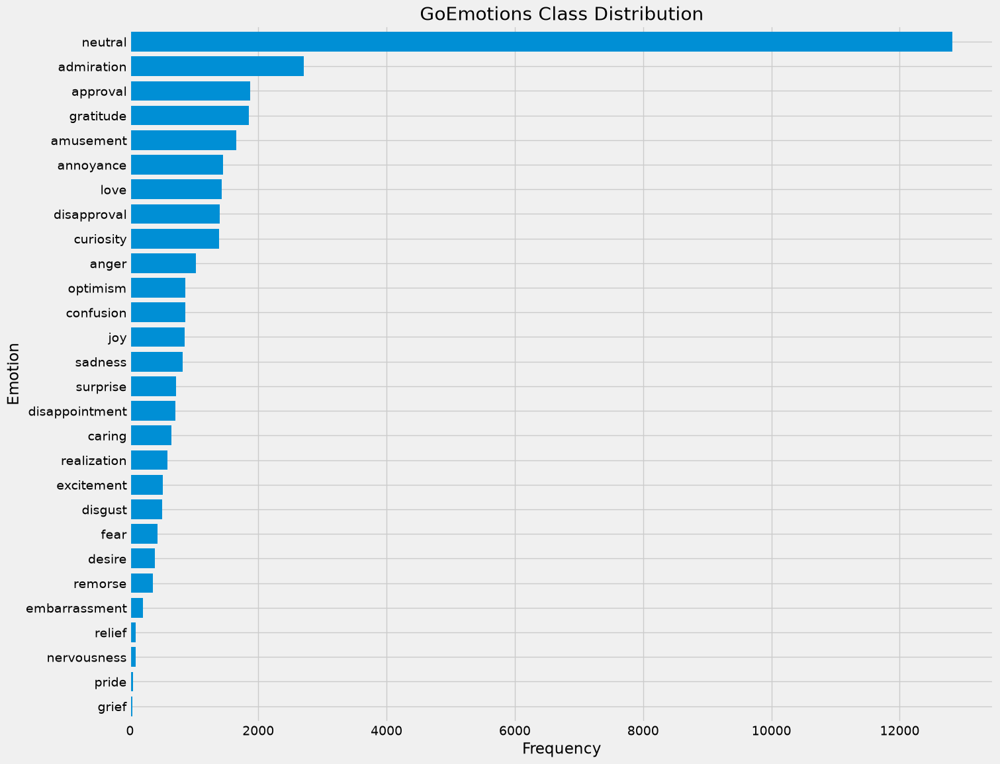

In [38]:
plt.style.use('fivethirtyeight')
class_distribution.sort_values().plot(
    kind="barh",
    figsize=(15, 13), 
    width=0.8
)

plt.xlabel("Frequency")
plt.ylabel("Emotion")
plt.title("GoEmotions Class Distribution")
plt.show()

In [39]:
class_distribution.index

Index(['neutral', 'admiration', 'approval', 'gratitude', 'amusement',
       'annoyance', 'love', 'disapproval', 'curiosity', 'anger', 'optimism',
       'confusion', 'joy', 'sadness', 'surprise', 'disappointment', 'caring',
       'realization', 'excitement', 'disgust', 'fear', 'desire', 'remorse',
       'embarrassment', 'relief', 'nervousness', 'pride', 'grief'],
      dtype='str', name='emotion')

In [40]:
class_distribution.values

array([12823,  2710,  1873,  1857,  1652,  1451,  1427,  1402,  1389,
        1025,   861,   858,   853,   817,   720,   709,   649,   586,
         510,   498,   430,   389,   353,   203,    88,    85,    51,
          39])

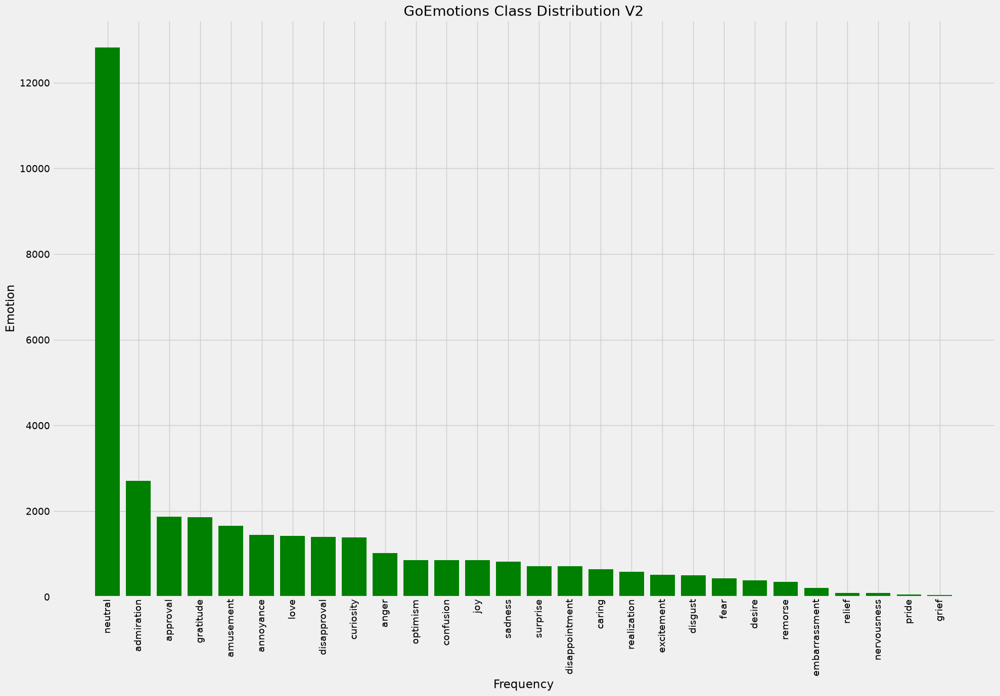

In [41]:
plt.style.use('fivethirtyeight')

plt.figure(figsize=(20, 14))
width=0.8

plt.bar(class_distribution.index, class_distribution.values, width=width, color='green')

plt.title("GoEmotions Class Distribution V2")
plt.xlabel("Frequency")
plt.ylabel("Emotion")

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [42]:
# Validate there are no missing values.
print(single_label_df[['text', 'emotion']].isnull().sum())

text       0
emotion    0
dtype: int64


### TF-IDF (Term Frequency and Inverse Document Frequency)

* TF = Term Frequency
  - How often does a word appear in the specific text?

  - EX: "I am really happy and happy today"
    - "happy" appears TWICE. --> leads to relatively higher TF(more importance).

* IDF = Inverse Document Frequency
  - How common is the word across the entire dataset?

  - EX: If "happy" appears in only a SMALL portion of thousands of comments, it's potentially USEFUL for distinguishing emotions.

  - EX: The word "the" appears in almost every comment, it isn't very useful for distinguishing emotions. 
    - TF-IDF then gives it a LOWER weight.

* We will use TF-IDF for feature engineering. 
  - It essentially asks which words/phrases in our text document are informative.

* Logistic Regression model will need the words to be converted into nuemrical input.

### Some Word Clouds

In [43]:
from wordcloud import WordCloud

In [44]:
single_label_df

,text,emotion_ids,id,emotion
0,My favourite food is anything I didn't have to...,27,eebbqej,neutral
1,"Now if he does off himself, everyone will thin...",27,ed00q6i,neutral
2,WHY THE FUCK IS BAYLESS ISOING,2,eezlygj,anger
3,To make her feel threatened,14,ed7ypvh,fear
4,Dirty Southern Wankers,3,ed0bdzj,annoyance
...,...,...,...,...
43405,Added you mate well I’ve just got the bow and ...,18,edsb738,love
43406,Always thought that was funny but is it a refe...,6,ee7fdou,confusion
43407,What are you talking about? Anything bad that ...,3,efgbhks,annoyance
43408,"More like a baptism, with sexy results!",13,ed1naf8,excitement


In [45]:
single_label_df[single_label_df['emotion'] == 'amusement']

,text,emotion_ids,id,emotion
67,"And then they say, “HAHAHAHHA IT WAS RIGHT THE...",1,edk90ck,amusement
79,"just noticed, lol. damn pervert foreigners.",1,ed4ji7m,amusement
150,Lmao Stole my joke! 😂,1,efbzkjj,amusement
249,"Lol, get em Corsi!",1,eep5xry,amusement
259,"Lol, that’s funny. I’ll have to find our Aggie...",1,edtjgrw,amusement
...,...,...,...,...
43259,"Hahaha, ok. I was worried there for a second....",1,eek3s6m,amusement
43312,I never said it should have been called. I jus...,1,eeybyor,amusement
43322,"Lol ""Weapons grade weed"", I love it",1,eed4511,amusement
43354,Well then town is flummery for not guilty'ing ...,1,edkq0wf,amusement


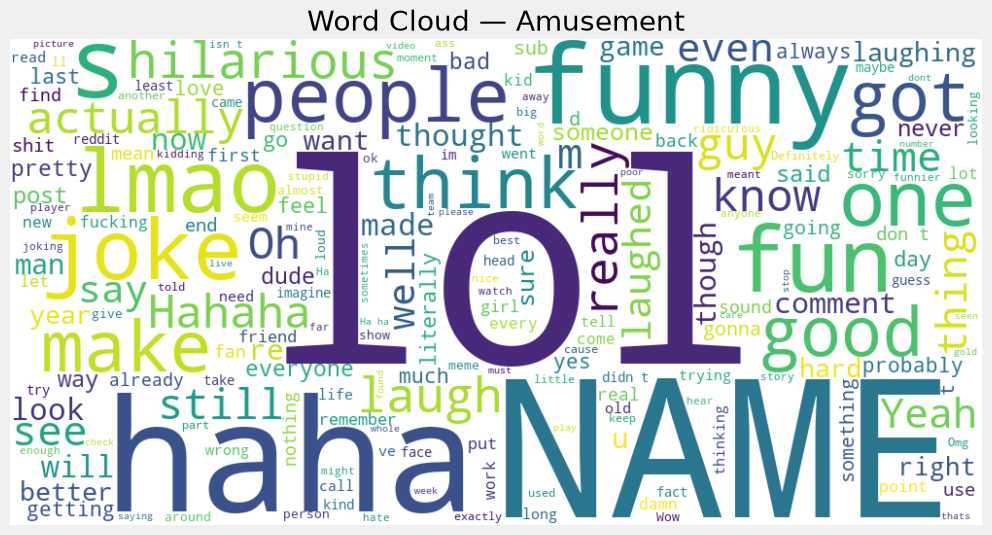

In [46]:
emotion = "amusement"

text = " ".join(
    single_label_df.loc[
        single_label_df["emotion"] == emotion,
        "text"
    ]
)

wordcloud = WordCloud(
    width=1000,
    height=500,
    background_color="white",
    stopwords=None
).generate(text)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title(f"Word Cloud — {emotion.title()}")
plt.show()

## X and Y Training Split

In [47]:
single_label_df.head()

,text,emotion_ids,id,emotion
0,My favourite food is anything I didn't have to...,27,eebbqej,neutral
1,"Now if he does off himself, everyone will thin...",27,ed00q6i,neutral
2,WHY THE FUCK IS BAYLESS ISOING,2,eezlygj,anger
3,To make her feel threatened,14,ed7ypvh,fear
4,Dirty Southern Wankers,3,ed0bdzj,annoyance


In [48]:
x = single_label_df['text']
x.head()

0    My favourite food is anything I didn't have to...
1    Now if he does off himself, everyone will thin...
2                       WHY THE FUCK IS BAYLESS ISOING
3                          To make her feel threatened
4                               Dirty Southern Wankers
Name: text, dtype: str

In [49]:
y = single_label_df['emotion']
y

0           neutral
1           neutral
2             anger
3              fear
4         annoyance
            ...    
43405          love
43406     confusion
43407     annoyance
43408    excitement
43409           joy
Name: emotion, Length: 36308, dtype: str

In [50]:
print(f'Features: {x.shape}')
print(f'Target: {y.shape}')

Features: (36308,)
Target: (36308,)


### Splitting the data into training and test sets.

* stratify() ensures the proportion of different classes in our target stays approximately the same in both training and testing sets.

In [51]:
from sklearn.model_selection import train_test_split

In [52]:
X_train, X_val, y_train, y_val = train_test_split(
  x, 
  y, 
  test_size=0.33, 
  random_state=42, 
  stratify=y
)

In [53]:
print(f'Training Data: {len(X_train)}')
print(f'Validation Data: {len(X_val)}')

Training Data: 24326
Validation Data: 11982


In [54]:
from sklearn.feature_extraction.text import TfidfVectorizer

* ngram_range=(1, 2) → learns from both individual words and 2-word phrases.
  - We are creating features for every individual word AND every 2-word sequence.
  - EX:
    - "sad" = unigram

    - "feel sad" = bigram

  - EX: "I feel really sad"
    - Unigrams:
      - I
      - feel
      - really
      - sad
    
    - Bigrams:
      - I feel 
      - feel really
      - really sad

  - EX: "I am not happy". 
    - Without bigrams, we'd wouldn't have "not happy", which differs...
    - ...from when the word "happy" appears in this sentence and a sentence like "I am happy".

    - Unigrams:
      - I
      - am 
      - not
      - happy
    
    - Bigrams:
      - I am
      - am not
      - not happy

  - EX: "I absolutely love this" --> Model can learn that "absolutely love" is an especially strong phase.
    - Unigrams:
      - I
      - absolutely
      - love 
      - this
    
    - Bigrams:
      - I absolutely 
      - absolutely love
      - love this

* min_df=2 --> How frequently a feature has to appear before TF-IDF considers it useful enough to keep.
  - Keep a word/phrase only if it appears in at least 2 different training text/DOCUMENTS.

  - NOT the frequency. If the word "happy" appears 4 times in only ONE document, it would NOT be included since the minimum requirement is 2.

  - EX: We keep "feel", "happy", "today"
    - 1. "I feel happy today"
    - 2. "I feel sad today"
    - 3. "I feel happy"
    - 4. "This is amazing"

* "min_df" applies to BIGRAMS too.
  - EX: 
    - Document 1: "I feel happy"
    - Document 2: "I feel sad"
    - Document 3: "I feel happy"
  
  * Potential bigrams include:
    - I feel
    - feel happy
    - feel sad

  * Their document frequencies are:
    - "I feel"     → 3 documents
    - "feel happy" → 2 documents
    - "feel sad"   → 1 document
  
  * With "min_df=2", we keep:
    - I feel
    - feel happy


In [55]:
# "Look at individual words and 2-word phrases, but exclude any word or phrase that appears in only ONE training example/document."
tfidf = TfidfVectorizer(
  ngram_range=(1, 2), 
  min_df=2
)

In [56]:
tfidf

,"ngram_range ngram_range: tuple (min_n, max_n), default=(1, 1)The lower and upper boundary of the range of n-values for differentn-grams to be extracted. All values of n such that min_n <= n <= max_nwill be used. For example an ``ngram_range`` of ``(1, 1)`` means onlyunigrams, ``(1, 2)`` means unigrams and bigrams, and ``(2, 2)`` meansonly bigrams.Only applies if ``analyzer`` is not callable.","(1, ...)"
,"min_df min_df: float or int, default=1When building the vocabulary ignore terms that have a documentfrequency strictly lower than the given threshold. This value is alsocalled cut-off in the literature.If float in range of [0.0, 1.0], the parameter represents a proportionof documents, integer absolute counts.This parameter is ignored if vocabulary is not None.",2
,"input input: {'filename', 'file', 'content'}, default='content'- If `'filename'`, the sequence passed as an argument to fit is expected to be a list of filenames that need reading to fetch the raw content to analyze.- If `'file'`, the sequence items must have a 'read' method (file-like object) that is called to fetch the bytes in memory.- If `'content'`, the input is expected to be a sequence of items that can be of type string or byte.",'content'
,"encoding encoding: str, default='utf-8'If bytes or files are given to analyze, this encoding is used todecode.",'utf-8'
,"decode_error decode_error: {'strict', 'ignore', 'replace'}, default='strict'Instruction on what to do if a byte sequence is given to analyze thatcontains characters not of the given `encoding`. By default, it is'strict', meaning that a UnicodeDecodeError will be raised. Othervalues are 'ignore' and 'replace'.",'strict'
,"strip_accents strip_accents: {'ascii', 'unicode'} or callable, default=NoneRemove accents and perform other character normalizationduring the preprocessing step.'ascii' is a fast method that only works on characters that havea direct ASCII mapping.'unicode' is a slightly slower method that works on any characters.None (default) means no character normalization is performed.Both 'ascii' and 'unicode' use NFKD normalization from:func:`unicodedata.normalize`.",None
,"lowercase lowercase: bool, default=TrueConvert all characters to lowercase before tokenizing.",True
,"preprocessor preprocessor: callable, default=NoneOverride the preprocessing (string transformation) stage whilepreserving the tokenizing and n-grams generation steps.Only applies if ``analyzer`` is not callable.",None
,"tokenizer tokenizer: callable, default=NoneOverride the string tokenization step while preserving thepreprocessing and n-grams generation steps.Only applies if ``analyzer == 'word'``.",None
,"analyzer analyzer: {'word', 'char', 'char_wb'} or callable, default='word'Whether the feature should be made of word or character n-grams.Option 'char_wb' creates character n-grams only from text insideword boundaries; n-grams at the edges of words are padded with space.If a callable is passed it is used to extract the sequence of featuresout of the raw, unprocessed input... versionchanged:: 0.21 Since v0.21, if ``input`` is ``'filename'`` or ``'file'``, the data is first read from the file and then passed to the given callable analyzer.",'word'
,"stop_words stop_words: {'english'}, list, default=NoneIf a string, it is passed to _check_stop_list and the appropriate stoplist is returned. 'english' is currently the only supported stringvalue.There are several known issues with 'english' and you shouldconsider an alternative (see :ref:`stop_words`).If a list, that list is assumed to contain stop words, all of whichwill be removed from the resulting tokens.Only applies if ``analyzer == 'word'``.If None, no stop words will be used. In this case, setting `max_df`to a higher value, such as in the range (0.7, 1.0), can automatically detectand filter stop words based on intra corpus document frequency of terms.",None


In [57]:
# Learns the vocabulary and TF-IDF weights only from the training data.
x_train_tfidf = tfidf.fit_transform(X_train)
# Apply that learned vocabulary to validation data. 
# Use only "transform" on validation set, because we do NOT want data leakage where info from the validation set enters the training set.
x_val_tfidf = tfidf.transform(X_val)

print(f"Training TF-IDF shape: {x_train_tfidf.shape}")
print(f"Validation TF-IDF shape: {x_val_tfidf.shape}")

Training TF-IDF shape: (24326, 35522)
Validation TF-IDF shape: (11982, 35522)


In [58]:
x_train_tfidf

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 420390 stored elements and shape (24326, 35522)>

In [59]:
x_val_tfidf

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 191337 stored elements and shape (11982, 35522)>

* We ended up with 35,522 features, which could consist of a mix of unigrams and bigrams.

In [60]:
# Looking into what those 35,522 features actually are.
feature_names = tfidf.get_feature_names_out()

print(f'Number of features: {len(feature_names)}')
print(feature_names[:50])

Number of features: 35522
['00' '000' '000 dollars' '000 fine' '000 people' '01' '05' '10' '10 000'
 '10 10' '10 15' '10 20' '10 but' '10 for' '10 games' '10 hours' '10 mins'
 '10 minute' '10 minutes' '10 of' '10 on' '10 seconds' '10 times'
 '10 words' '10 would' '10 year' '10 years' '100' '100 in' '100 name'
 '100 of' '100 scam' '100 sure' '100 the' '100 times' '100 years' '1000'
 '100k' '101' '10k' '10th' '10x' '11' '11 10' '11 years' '11am' '12'
 '12 episodes' '12 hours' '12 year']


## Logistic Regression Classifier

In [61]:
from sklearn.linear_model import LogisticRegression

In [62]:
# Balance class weights, since our dataset has extremely imbalanced classes. 
# Recall that "neutral" has 12,823 examples while "grief: has only 39.
lr_model = LogisticRegression(
  max_iter=1000, 
  class_weight='balanced', 
  random_state=42
)

lr_model.fit(x_train_tfidf, y_train)

,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",'balanced'
,"random_state random_state: int, RandomState instance, default=NoneOnly used for `solver` == 'sag', 'saga' or 'liblinear' to shuffle thedata. It has no effect on the other solvers.See :term:`Glossary <random_state>` for details.",42
,"max_iter max_iter: int, default=100Maximum number of iterations taken for the solvers to converge.",1000
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add an L2 penalty term and it is the default choice;- `'l1'`: add an L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` and `C` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'`, `l1_ratio` set to any float between 0 and 1 for `penalty='elasticnet'`, and `C=np.inf` for `penalty=None`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation <regularized-logistic-loss>`) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to u

In [63]:
from sklearn.metrics import accuracy_score, f1_score
from sklearn.metrics import classification_report

In [64]:
y_pred = lr_model.predict(x_val_tfidf)

print(f"Accuracy: {accuracy_score(y_val, y_pred):.4f}")

# Calculates F1 separately for each of the 28 emotions and gives every emotion equal weight. This is particularly important because the classes are extremely imbalanced.
print(f"Macro F1: {f1_score(y_val, y_pred, average='macro'):.4f}")

# Gives more weight to emotions with more examples.
print(f"Weighted F1: {f1_score(y_val, y_pred, average='weighted'):.4f}")

Accuracy: 0.4029
Macro F1: 0.3851
Weighted F1: 0.3980


In [65]:
print(classification_report(y_val, y_pred))

                precision    recall  f1-score   support

    admiration       0.59      0.61      0.60       894
     amusement       0.73      0.77      0.75       545
         anger       0.40      0.46      0.43       338
     annoyance       0.14      0.14      0.14       479
      approval       0.25      0.28      0.26       618
        caring       0.17      0.52      0.26       214
     confusion       0.25      0.43      0.31       283
     curiosity       0.30      0.52      0.38       458
        desire       0.33      0.66      0.44       128
disappointment       0.13      0.24      0.17       234
   disapproval       0.20      0.41      0.26       463
       disgust       0.28      0.44      0.34       164
 embarrassment       0.30      0.45      0.36        67
    excitement       0.21      0.36      0.26       168
          fear       0.37      0.53      0.44       142
     gratitude       0.92      0.85      0.89       613
         grief       0.12      0.15      0.13  

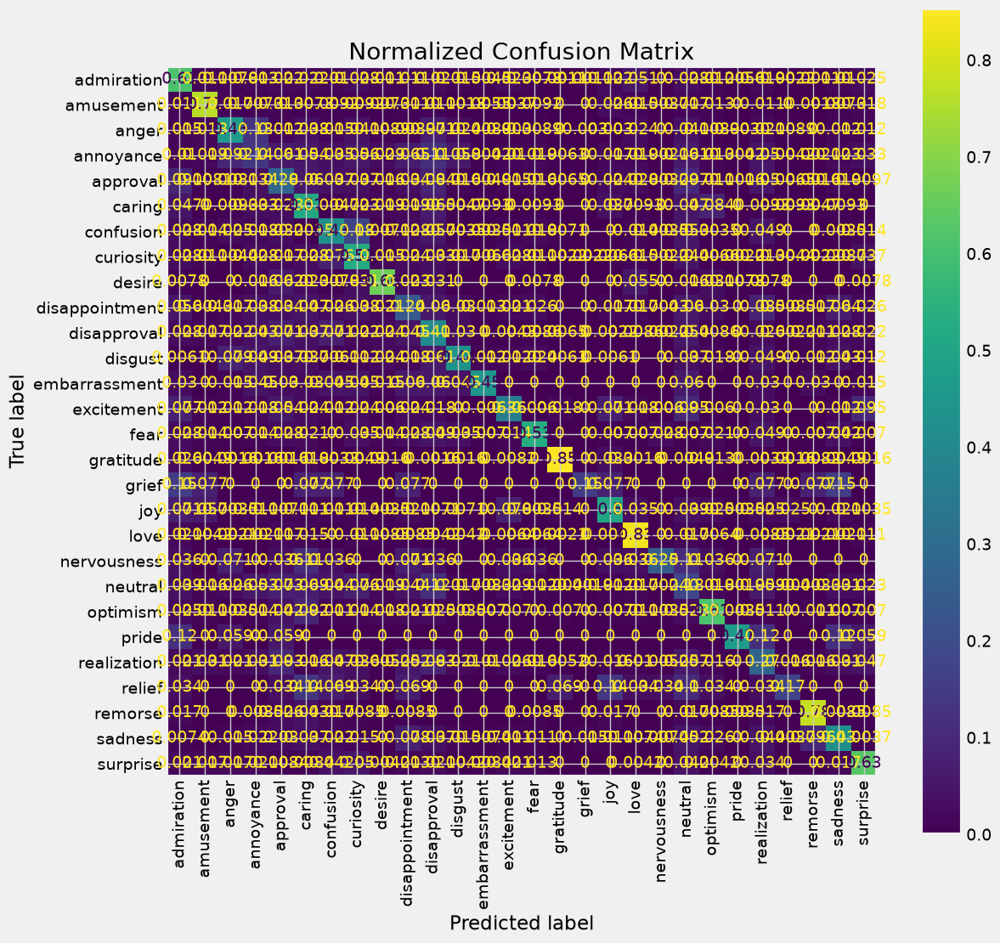

In [66]:
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 12))

ConfusionMatrixDisplay.from_predictions(
    y_val,
    y_pred,
    xticks_rotation="vertical",
    normalize="true",
    ax=ax
)

plt.title("Normalized Confusion Matrix")
plt.show()

In [67]:
# Looking into feature importance.
feature_names = tfidf.get_feature_names_out()

print(f'Number of features: {len(feature_names)}')
print(f"Number of classes: {len(lr_model.classes_)}")

Number of features: 35522
Number of classes: 28


In [68]:
# Gets emotion's learned coefficients.
# Finds the 10 largest positive coefficients.
# Retrieves the corresponding TF-IDF words/phrases.
# Stores them in top_features.
top_features = {}

for i, emotion in enumerate(lr_model.classes_):
    coefficients = lr_model.coef_[i]
    top_indices = coefficients.argsort()[-10:][::-1]
    
    top_features[emotion] = [
        (feature_names[j], coefficients[j])
        for j in top_indices
    ]

top_features_df = pd.DataFrame(
    top_features,
    index=range(1, 11)
)

top_features_df

,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,disappointment,...,love,nervousness,neutral,optimism,pride,realization,relief,remorse,sadness,surprise
1,"(great, 9.478392660823705)","(lol, 17.310005014324698)","(fuck, 8.451550260055043)","(stupid, 4.436914715824319)","(agree, 6.580928335061963)","(you, 6.5082919107712245)","(confused, 6.372953151010952)","(curious, 6.50669958188909)","(wish, 14.990928979601746)","(disappointed, 5.036703700810069)",...,"(love, 19.405306251731293)","(nervous, 6.576445509161267)","(name, 1.85792139483908)","(hope, 13.98071623824797)","(proud, 7.913833111251357)","(realized, 5.219059399737157)","(glad, 7.2845096046268765)","(sorry, 17.76111630341356)","(sad, 11.278505979554307)","(surprised, 10.932703706242332)"
2,"(good, 6.604370230238821)","(haha, 8.693769664129652)","(fucking, 6.483257659166971)","(annoying, 3.9894296619801297)","(yes, 4.083677541573263)","(careful, 4.277121454194623)","(not sure, 5.298690450384889)","(what, 4.844425873604725)","(want, 7.186423542803609)","(disappointing, 4.603161826409806)",...,"(loved, 7.050405653236659)","(worried, 5.67080846165112)","(they, 1.6488614525294232)","(hopefully, 7.732085196820884)","(pride, 5.224430035254293)","(realize, 5.10855323983596)","(relief, 5.701425140072924)","(regret, 5.598071167742103)","(sadly, 7.131841880355263)","(wow, 8.69482380670524)"
3,"(awesome, 6.090894986370548)","(funny, 7.728235943259717)","(hate, 5.747500758748918)","(shit, 2.6107556387682003)","(right, 3.9375130088959054)","(yourself, 4.223246837211106)","(why, 5.169265663962903)","(why, 4.524818345852418)","(need, 5.166084425636544)","(miss, 3.4386886302857325)",...,"(like, 6.605073170907728)","(worrying, 5.573571404177432)","(he, 0.8940143485931363)","(hoping, 6.561979110263404)","(have these, 4.148029813653707)","(forgot, 3.188472534805128)","(at least, 3.8873836079198343)","(guilty, 4.509176329305325)","(sorry, 5.934456869135137)","(wonder, 6.424068023458433)"
4,"(amazing, 5.964324339760865)","(lmao, 6.345176798658793)","(angry, 3.904862062564271)","(fucking, 2.119676760577798)","(yeah, 3.6258636359207963)","(worry, 4.191802535282939)","(or, 4.903574384073668)","(do you, 4.099584487984585)","(wanted, 3.7886839635368874)","(bad, 3.361121927450804)",...,"(loves, 4.242536926671875)","(anxiety, 5.489329329413518)","(she, 0.7772311681964654)","(luck, 4.458254328243051)","(myself, 4.038177387316856)","(remember, 2.8078002798712647)","(relaxed, 3.830030350002669)","(apologize, 3.541578911087156)","(hurts, 4.323157045285327)","(omg, 4.80543330323569)"
5,"(beautiful, 5.439727623665223)","(fun, 5.804645301425558)","(stupid, 3.44730423216534)","(stop, 2.105181895925306)","(sure, 3.5979562805481957)","(your, 4.15046436404708)","(don, 4.114388095093031)","(did, 3.6785311720578)","(hope, 3.673621064003858)","(disappointment, 3.2460907110779407)",...,"(favorite, 3.4592741067526735)","(anxious, 5.13143242572929)","(on, 0.7229335973515604)","(hope you, 3.5475531379378076)","(so proud, 3.7386127235692395)","(thought, 2.731873221337816)","(thank god, 3.7400782803262858)","(apologies, 3.4585063782609025)","(poor, 4.257954621943483)","(shocked, 4.734439940083437)"
6,"(nice, 4.976091629152006)","(hilarious, 5.326812408279178)","(shut, 3.070304370517374)","(fuck, 2.0355579310563603)","(agreed, 2.920590279211453)","(don worry, 3.866588414898037)","(don know, 3.8766526376206705)","(is that, 3.6578166197449016)","(to, 2.9705080225266443)","(lost, 3.244440592297822)",...,"(loving, 2.805057908912256)","(edgy, 4.765021189294632)","(remindme, 0.6910436905032646)","(will, 3.503248135755755)","(with pride, 3.341745404245959)","(was, 2.4804677995484847)","(least, 3.6794833538438705)","(sorry but, 2.9286582042445577)","(miss, 3.7797531838985723)","(can believe, 4.7033460794869395)"
7,"(best, 4.086450071292003)","(hahaha, 5.048787785063773)","(dare, 3.0304329736888174)","(you, 1.9875994593316557)","(ok, 2.6004705012714324)","(stay, 3.8332546900831312)","(sure, 3.80553

In [69]:
top_features

{'admiration': [('great', np.float64(9.478392660823705)),
  ('good', np.float64(6.604370230238821)),
  ('awesome', np.float64(6.090894986370548)),
  ('amazing', np.float64(5.964324339760865)),
  ('beautiful', np.float64(5.439727623665223)),
  ('nice', np.float64(4.976091629152006)),
  ('best', np.float64(4.086450071292003)),
  ('cute', np.float64(3.832984930892479)),
  ('pretty', np.float64(3.559192866197703)),
  ('appreciate', np.float64(3.0724323021044433))],
 'amusement': [('lol', np.float64(17.310005014324698)),
  ('haha', np.float64(8.693769664129652)),
  ('funny', np.float64(7.728235943259717)),
  ('lmao', np.float64(6.345176798658793)),
  ('fun', np.float64(5.804645301425558)),
  ('hilarious', np.float64(5.326812408279178)),
  ('hahaha', np.float64(5.048787785063773)),
  ('joke', np.float64(4.825139367343472)),
  ('laughing', np.float64(3.90742139115985)),
  ('laughed', np.float64(3.6878252612990368))],
 'anger': [('fuck', np.float64(8.451550260055043)),
  ('fucking', np.float64

In [70]:
lr_model.classes_

array(['admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'neutral',
       'optimism', 'pride', 'realization', 'relief', 'remorse', 'sadness',
       'surprise'], dtype=object)

## SVM

* Trying a basic SVM model with the same TF-IDF features to see if changing the model has any effect.

In [71]:
from sklearn.svm import LinearSVC

In [72]:
x_train_tfidf

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 420390 stored elements and shape (24326, 35522)>

In [73]:
y_train

459        curiosity
23430      amusement
18493      gratitude
16724    disapproval
17768      gratitude
            ...     
13315          anger
25736        neutral
10516       approval
26792       approval
23429        neutral
Name: emotion, Length: 24326, dtype: str

In [74]:
svm_model = LinearSVC()
svm_model.fit(x_train_tfidf, y_train)

,"penalty penalty: {'l1', 'l2'}, default='l2'Specifies the norm used in the penalization. The 'l2'penalty is the standard used in SVC. The 'l1' leads to ``coef_``vectors that are sparse.",'l2'
,"loss loss: {'hinge', 'squared_hinge'}, default='squared_hinge'Specifies the loss function. 'hinge' is the standard SVM loss(used e.g. by the SVC class) while 'squared_hinge' is thesquare of the hinge loss. The combination of ``penalty='l1'``and ``loss='hinge'`` is not supported.",'squared_hinge'
,"dual dual: ""auto"" or bool, default=""auto""Select the algorithm to either solve the dual or primaloptimization problem. Prefer dual=False when n_samples > n_features.`dual=""auto""` will choose the value of the parameter automatically,based on the values of `n_samples`, `n_features`, `loss`, `multi_class`and `penalty`. If `n_samples` < `n_features` and optimizer supportschosen `loss`, `multi_class` and `penalty`, then dual will be set to True,otherwise it will be set to False... versionchanged:: 1.3 The `""auto""` option is added in version 1.3 and will be the default in version 1.5.",'auto'
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"C C: float, default=1.0Regularization parameter. The strength of the regularization isinversely proportional to C. Must be strictly positive.For an intuitive visualization of the effects of scalingthe regularization parameter C, see:ref:`sphx_glr_auto_examples_svm_plot_svm_scale_c.py`.",1.0
,"multi_class multi_class: {'ovr', 'crammer_singer'}, default='ovr'Determines the multi-class strategy if `y` contains more thantwo classes.``""ovr""`` trains n_classes one-vs-rest classifiers, while``""crammer_singer""`` optimizes a joint objective over all classes.While `crammer_singer` is interesting from a theoretical perspectiveas it is consistent, it is seldom used in practice as it rarely leadsto better accuracy and is more expensive to compute.If ``""crammer_singer""`` is chosen, the options loss, penalty and dualwill be ignored.",'ovr'
,"fit_intercept fit_intercept: bool, default=TrueWhether or not to fit an intercept. If set to True, the feature vectoris extended to include an intercept term: `[x_1, ..., x_n, 1]`, where1 corresponds to the intercept. If set to False, no intercept will beused in calculations (i.e. data is expected to be already centered).",True
,"intercept_scaling intercept_scaling: float, default=1.0When `fit_intercept` is True, the instance vector x becomes ``[x_1,..., x_n, intercept_scaling]``, i.e. a ""synthetic"" feature with aconstant value equal to `intercept_scaling` is appended to the instancevector. The intercept becomes intercept_scaling * synthetic featureweight. Note that liblinear internally penalizes the intercept,treating it like any other term in the feature vector. To reduce theimpact of the regularization on the intercept, the `intercept_scaling`parameter can be set to a value greater than 1; the higher the value of`intercept_scaling`, the lower the impact of regularization on it.Then, the weights become `[w_x_1, ..., w_x_n,w_intercept*intercept_scaling]`, where `w_x_1, ..., w_x_n` representthe feature weights and the intercept weight is scaled by`intercept_scaling`. This scaling allows the intercept term to have adifferent regularization behavior compared to the other features.",1
,"class_weight class_weight: dict or 'balanced', default=NoneSet the parameter C of class i to ``class_weight[i]*C`` forSVC. If not given, all classes are supposed to haveweight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.",None
,"verbose verbose: int, default=0Enable verbose output. Note that this setting takes advantage of aper-process runtime setting in liblinear that, if enabled, may not workproperly in a multithreaded context.",0
,"random_state random_state: int, RandomState instance or None, default=NoneControls the pseudo rand

In [75]:
y_pred_svm = svm_model.predict(x_val_tfidf)
y_pred_svm

array(['amusement', 'gratitude', 'neutral', ..., 'neutral', 'disapproval',
       'neutral'], shape=(11982,), dtype=object)

In [76]:
print(f"SVM Accuracy: {accuracy_score(y_val, y_pred_svm)}")

SVM Accuracy: 0.5438157235853781


In [77]:
print(classification_report(y_val, y_pred_svm))

                precision    recall  f1-score   support

    admiration       0.59      0.64      0.61       894
     amusement       0.71      0.74      0.73       545
         anger       0.49      0.35      0.41       338
     annoyance       0.19      0.10      0.13       479
      approval       0.27      0.16      0.20       618
        caring       0.36      0.20      0.26       214
     confusion       0.49      0.27      0.35       283
     curiosity       0.42      0.28      0.33       458
        desire       0.60      0.40      0.48       128
disappointment       0.23      0.09      0.12       234
   disapproval       0.24      0.14      0.18       463
       disgust       0.58      0.32      0.41       164
 embarrassment       0.50      0.15      0.23        67
    excitement       0.38      0.17      0.24       168
          fear       0.64      0.39      0.49       142
     gratitude       0.91      0.89      0.90       613
         grief       0.33      0.08      0.12  

In [78]:
class_distribution

emotion
neutral           12823
admiration         2710
approval           1873
gratitude          1857
amusement          1652
annoyance          1451
love               1427
disapproval        1402
curiosity          1389
anger              1025
optimism            861
confusion           858
joy                 853
sadness             817
surprise            720
disappointment      709
caring              649
realization         586
excitement          510
disgust             498
fear                430
desire              389
remorse             353
embarrassment       203
relief               88
nervousness          85
pride                51
grief                39
Name: count, dtype: int64

* SVM accuracy is a slight improvement from the Logistic Regression accuracy.

* It actually does really well on a lot of the more freqeuntly occurring emotions like "admiration" and "neutral".

* It does not do as well as the less frequent emotions like "disppointment" and "grief" due to class imbalance.

* We could experiment with an SVM using balanced class weights.
  - Model would give more weight to mistakes on minority classes.

  - Model is now putting more weight on rare emotions, instead of favoring the more frequent classes, so accuracy may drop.

In [79]:
# SVM with balanced class weights
svm_balanced = LinearSVC(class_weight="balanced")

# Train
svm_balanced.fit(x_train_tfidf, y_train)

# Predict
y_pred_balanced = svm_balanced.predict(x_val_tfidf)

# Evaluate
print("SVM Balanced Accuracy:", accuracy_score(y_val, y_pred_balanced))
print(classification_report(y_val, y_pred_balanced))

SVM Balanced Accuracy: 0.46094141211817724
                precision    recall  f1-score   support

    admiration       0.57      0.66      0.61       894
     amusement       0.68      0.80      0.73       545
         anger       0.37      0.42      0.39       338
     annoyance       0.15      0.15      0.15       479
      approval       0.24      0.22      0.23       618
        caring       0.25      0.40      0.31       214
     confusion       0.27      0.37      0.31       283
     curiosity       0.33      0.43      0.37       458
        desire       0.38      0.52      0.44       128
disappointment       0.15      0.20      0.17       234
   disapproval       0.21      0.28      0.24       463
       disgust       0.32      0.40      0.36       164
 embarrassment       0.31      0.42      0.36        67
    excitement       0.25      0.33      0.29       168
          fear       0.41      0.54      0.46       142
     gratitude       0.90      0.89      0.90       613
    

* SVM using balanced class weights results
  - Model would give more weight to mistakes on minority classes.

  - Model is now putting more weight on rare emotions, instead of favoring the more frequent classes, so accuracy did drop from 54% to 46%.

* Balanced model is less willing to predict our most frequent class "neutral"

## Word Embeddings(Word2Vec)

* Word Vectors = another approch to turning text into a numerical vector to capture SEMANTIC meaning.

  - Utilize surrounding tokens to figure out context of each token.

* We want SIMILAR words to be mapped into SIMILAR SPACE in vector space.
  - EX: Colors like "red", "blue", "yellow" are mapped in a similar space.

* Word2Vec is one method.
  - Continuous bag of words

  - skipgram

* Gensim will allow us to train our own Word2Vec word vectors.

* spaCy has pretrained word vectors.

### spaCy Word2Vec

In [80]:
import spacy

In [81]:
# Load in the medium sized word embeddings model from spaCy.
# python -m spacy download en_core_web_md
nlp = spacy.load("en_core_web_md")

/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/torch/jit/_script.py:1485: FutureWarning: `torch.jit.script` is not supported in Python 3.14+ and may break. Please switch to `torch.compile` or `torch.export`.
  warnings.warn(


In [82]:
# Verify the vectors.
print(nlp.vocab.vectors.shape)

(20000, 300)


In [83]:
X_train

459      I'm curious though, will they upvote it to own...
23430    i'm just making fun of how when moids say they...
18493                                      I will! Thanks!
16724    $11 an hour doesn't leave a lot of room to be ...
17768                                     Oh okay. Thanks.
                               ...                        
13315    Fuck it, maybe the faceless men worship the gr...
25736    I drive semi trucks into denver. Im not there ...
10516    Yeah you're right, I mistyped it. Should have ...
26792    Yes, he's really pushing the Devils to new hei...
23429                                    Resting cash face
Name: text, Length: 24326, dtype: str

In [84]:
# Runs every text in your training/test sets through spaCy's NLP pipeline and converts into a "Doc" object.
# Doc object contains info spaCy can use like: tokens, part-of-speech info, named entities, token vectors, etc.
train_x_docs = list(nlp.pipe(X_train))
test_x_docs = list(nlp.pipe(X_val))

In [85]:
train_x_docs

[I'm curious though, will they upvote it to own the ~~libs~~ [NAME]?,
 i'm just making fun of how when moids say they like personality they dont really mean it,
 I will! Thanks!,
 $11 an hour doesn't leave a lot of room to be a hero.,
 Oh okay. Thanks.,
 TOLD YOU ALL, bravo,
 > Killing an intruder in your home in self defense is now a really bad thing. That was not even under discussion.,
 Its acts as a moisture barrier so the bread wont get soggy no matter what you put in it,
 I'm 27. I've been thinking about joining the club, just to avoid this inevitability ,
 I made the mistake of choosing [NAME] once. I'm literaly unable to change characters in Tekken for the rest of my life.,
 That game hurt.,
 Wow I didn't know it changed your face so it doesn't break rule 1 and 2? /s,
 He's a sexist piece of shit regardless so,
 Galaxy flip already exists. Its DMT, MDMA, LSD, Ketamine, and Cocaine together :) Never heard of anyone doing it tho,
 I'm not having any thoughts that are safe for me 

In [86]:
x_train_spacy = [doc.vector for doc in train_x_docs]
x_test_spacy = [doc.vector for doc in test_x_docs]

In [87]:
x_train_spacy

[array([-6.72444642e-01,  1.21979408e-01, -1.81192368e-01, -1.58105344e-01,
        -1.27180979e-01,  6.42099837e-03, -2.64548827e-02, -3.49113524e-01,
         8.51375908e-02,  1.73353541e+00, -3.35203439e-01, -1.36099383e-02,
         4.56241192e-03,  1.42244399e-01, -2.15147167e-01, -1.11033563e-02,
        -1.48411244e-01,  6.53029740e-01, -2.08594829e-01,  2.30659619e-02,
         3.06351148e-02,  1.54528826e-01,  8.72870628e-03, -2.07854867e-01,
         3.95834111e-02, -1.68059871e-01, -1.00610353e-01, -1.85120583e-01,
         1.40916556e-01, -2.15877537e-02, -3.17902304e-02,  9.22567695e-02,
        -2.68837661e-02,  3.15277018e-02,  2.00831681e-01,  1.69546127e-01,
        -2.94243451e-02,  8.63734912e-03, -1.39129662e-03,  1.09094881e-01,
        -1.07816160e-01, -3.73380678e-03,  4.82899919e-02,  3.28624137e-02,
         1.24385148e-01, -1.54040903e-01,  5.52442670e-02,  1.34004354e-01,
        -1.21481992e-01,  3.54309976e-02, -8.41231197e-02,  2.78658628e-01,
         1.0

In [88]:
x_test_spacy

[array([-6.44783318e-01, -9.19899940e-02, -1.44768327e-01, -3.00440669e-01,
         9.94748995e-02, -6.55699968e-02,  4.84923683e-02, -7.34043360e-01,
         1.08639657e-01,  1.31535336e-01, -4.83773321e-01,  7.76960999e-02,
        -1.08711660e-01,  1.85842678e-01,  4.81763296e-02,  8.97530019e-02,
         6.00266568e-02,  8.32920015e-01, -1.90521002e-01,  4.60090255e-03,
         1.19693339e-01,  1.47637904e-01,  4.78866585e-02, -4.85873342e-01,
        -7.82909989e-02, -2.76266664e-01,  1.55252308e-01, -1.14563338e-01,
         3.27953339e-01,  2.79143333e-01,  1.28106669e-01, -1.33369371e-01,
         2.78573334e-01,  1.52929336e-01, -8.67966637e-02, -1.04106665e-01,
         5.62166683e-02,  1.71445325e-01, -1.67425990e-01,  8.97740051e-02,
        -1.42956659e-01, -1.71350002e-01,  1.86337650e-01,  1.20263338e-01,
         1.38086572e-01, -6.65666759e-02,  1.87229991e-01,  2.19276667e-01,
         1.05736675e-02,  2.50347495e-01,  1.33306012e-01,  2.34996676e-01,
         2.2

In [89]:
# Convert word embeddings to Numpy arrays.
x_train_spacy = np.array(x_train_spacy)
x_test_spacy = np.array(x_test_spacy)

print(x_train_spacy.shape)
print(x_test_spacy.shape)

(24326, 300)
(11982, 300)


### SVM Model Using Word Embeddings

In [90]:
svm_spacy = LinearSVC()

svm_spacy.fit(x_train_spacy, y_train)

y_pred_spacy = svm_spacy.predict(x_test_spacy)

In [91]:
print("spaCy SVM Accuracy:", accuracy_score(y_val, y_pred_spacy))
print(classification_report(y_val, y_pred_spacy))

spaCy SVM Accuracy: 0.3899182106493073
                precision    recall  f1-score   support

    admiration       0.38      0.24      0.29       894
     amusement       0.36      0.15      0.21       545
         anger       0.33      0.11      0.16       338
     annoyance       0.17      0.01      0.01       479
      approval       0.31      0.01      0.02       618
        caring       0.33      0.01      0.02       214
     confusion       0.00      0.00      0.00       283
     curiosity       0.00      0.00      0.00       458
        desire       0.00      0.00      0.00       128
disappointment       0.00      0.00      0.00       234
   disapproval       0.50      0.00      0.00       463
       disgust       0.39      0.10      0.16       164
 embarrassment       0.12      0.03      0.05        67
    excitement       0.10      0.01      0.01       168
          fear       0.33      0.03      0.05       142
     gratitude       0.47      0.46      0.47       613
        

/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, 

* The SVM model using the pre-trained word embedding vectors from spacy actually performed with 38% accuracy - a lot worse than the TF-IDF approach.

* TF-IDF perhaps did better since it preserves words as unigrams and bigrams, and uses them as features.
  - Words in an emotion classification task can be more informative.

  - TF-IDF can assign higher weights to emotionally informative words/phrases.

* spaCy vectors use STATIC word embeddings. A word could have one specific vector representation regardless of context.
  - EX: "I'm sick of this." versus "That movie was sick!"

  - The word "sick" potentially has the same underlying pretrained word vector.

* The use of spaCy's `doc.vector` also compresses the entire document into a single vector by AVERAGING the vectors of its tokens.
  - This can lose word-order and contextual information.

  - This may make it difficult for the SVM to distinguish nuanced emotions.

* We could maybe try using a Logistic Regression model with the pre-trained word embedding vectors for comparison.

* We were previously using the "medium" spaCy model, the "large" model could potentially have richer pretrained vectors, but the results probably won't change too much.

* Lower accuracy and Macro F1 scores.
  - Accuracy is dominated by "neutral" because it is abput 35% of the validation data. 
  
  - Macro F1 avoids that domination by weighting every class EQUALLY — which is exactly why it exposes how badly the model is doing on rare classes like "grief" and "desire" 
  
  - Despite accuracy being 38%.

### Logistic Regression Using Word Embeddings

In [92]:
lr_spacy = LogisticRegression(max_iter=1000)

lr_spacy.fit(x_train_spacy, y_train)

y_pred_spacy_lr = lr_spacy.predict(x_test_spacy)

In [93]:
print("spaCy + Logistic Regression Accuracy:",
      accuracy_score(y_val, y_pred_spacy_lr))

print(classification_report(y_val, y_pred_spacy_lr))

spaCy + Logistic Regression Accuracy: 0.3870806209313971
                precision    recall  f1-score   support

    admiration       0.41      0.27      0.32       894
     amusement       0.33      0.17      0.22       545
         anger       0.31      0.09      0.15       338
     annoyance       0.15      0.02      0.03       479
      approval       0.25      0.02      0.04       618
        caring       0.35      0.04      0.07       214
     confusion       0.00      0.00      0.00       283
     curiosity       0.00      0.00      0.00       458
        desire       0.20      0.01      0.02       128
disappointment       0.00      0.00      0.00       234
   disapproval       0.16      0.01      0.02       463
       disgust       0.41      0.09      0.14       164
 embarrassment       0.10      0.01      0.03        67
    excitement       0.09      0.02      0.03       168
          fear       0.38      0.04      0.08       142
     gratitude       0.51      0.43      0.46 

/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, 

* Ran the Logistic Regression model with spaCy word embeddings for comparison.
  - Their performances were roughly similar.

* This suggests that the document representation of compressing the document into averaged static embeddings may be the issue.

* Ensemble methods like Random Forest and Gradient Boosting will likely not perform as well as we have a lot of sparse high dimensional data("zero" features) in the TF-IDF dataset. 
  - Individual splits could carry little signal.

  - The weak word signals combine linearly in nature, so the linear models worked better.

* The ensemble methods on the dense spaCy embeddings may pick up some non-linear patterns.
  - Not expecting a big jump since the averaging of the word vectors has removed context like word order.

### Ensemble Methods With spaCy

* NOTE: This is mainly for experimentation.
  - We re curious about how ensemble approaches like Random Forest and Gradient Boosting will perform on the dense spaCy vectors.

In [94]:
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier

In [95]:
rf_spacy = RandomForestClassifier(random_state=42)

rf_spacy.fit(x_train_spacy, y_train)

y_pred_spacy_rf = rf_spacy.predict(x_test_spacy)

print("spaCy + Random Forest Accuracy:",
      accuracy_score(y_val, y_pred_spacy_rf))

print(classification_report(y_val, y_pred_spacy_rf))

spaCy + Random Forest Accuracy: 0.38182273410115175
                precision    recall  f1-score   support

    admiration       0.38      0.13      0.19       894
     amusement       0.34      0.07      0.12       545
         anger       0.33      0.02      0.03       338
     annoyance       0.11      0.00      0.00       479
      approval       0.22      0.01      0.01       618
        caring       1.00      0.01      0.02       214
     confusion       0.14      0.00      0.01       283
     curiosity       0.22      0.00      0.01       458
        desire       0.00      0.00      0.00       128
disappointment       0.00      0.00      0.00       234
   disapproval       0.14      0.00      0.00       463
       disgust       0.50      0.02      0.05       164
 embarrassment       0.00      0.00      0.00        67
    excitement       0.11      0.01      0.01       168
          fear       1.00      0.01      0.01       142
     gratitude       0.56      0.40      0.47      

/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/svenwu/Hustle/MachineLearning/venv/lib/python3.14/site-packages/sklearn/metrics/_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, 

In [96]:
gb_spacy = HistGradientBoostingClassifier(random_state=42)

gb_spacy.fit(x_train_spacy, y_train)

y_pred_spacy_gb = gb_spacy.predict(x_test_spacy)

print("spaCy + Gradient Boosting Accuracy:",
      accuracy_score(y_val, y_pred_spacy_gb))

print(classification_report(y_val, y_pred_spacy_gb))

spaCy + Gradient Boosting Accuracy: 0.3701385411450509
                precision    recall  f1-score   support

    admiration       0.39      0.18      0.25       894
     amusement       0.23      0.09      0.13       545
         anger       0.27      0.07      0.10       338
     annoyance       0.07      0.01      0.01       479
      approval       0.18      0.02      0.03       618
        caring       0.17      0.03      0.05       214
     confusion       0.11      0.02      0.04       283
     curiosity       0.24      0.02      0.03       458
        desire       0.00      0.00      0.00       128
disappointment       0.08      0.01      0.02       234
   disapproval       0.09      0.01      0.01       463
       disgust       0.21      0.06      0.09       164
 embarrassment       0.08      0.01      0.03        67
    excitement       0.05      0.01      0.02       168
          fear       0.50      0.04      0.08       142
     gratitude       0.53      0.45      0.49   

* Notice that Random Forest has a high recall score of 96% for the "neutral" category.
  - Model is likely NOT learning to distinguish "neutral", but rather it is defaulting to "neutral" as the predicted classification more often. 

  - Mostly working since "neutral" is about 35% of our validation set.

* Same with Gradient Boosting with its high recall wcore of 88% for "neutral".

* Macro F1 scores are also consistently on the lower end.
   - This takes the unweighted average across all 28 classes.

   - If "grief" only has 13 examples and "neutral" has 4234 examples, the accuracy is dominated by the model classifying "neutral" correctly most of the time. 

* Macro F1 score reveals the fact that "neutral" dominates, as it assigns each class equal weight.
   - As a result it penalizes less frequent emotions like "grief" and "desire" equally.

   - Every class contributes 1/28 to the macro average, so "neutral" domination in the test set has equal effect has a lower frequently seen emotion. 

    - The Macro F1 score is thus being pulled down by the other 20+ classes the model is failing to accurately classify.

* We've already tried weighing the class weights, so the loss function on rarer classes get more penalizations.

* Other potential next steps for addressing the class imbalance.
  - We could OVERSAMPLE the minority classes with duplication or synthetic data.

  - We could UNDERSAMPLEa the majority class, and randomly drop some "neutral" class examples. Might not be worth it to throw away some data points though.

  - Two-stage / hierarchical classification
    - We first train a binary "neutral vs. not-neutral" classifier
    
    - Then train a second classifier for the emotions among the non-neutral ones. 

## LSTM

* Moving on to long short-term memory approach.
  - We will be able to process the tokens sequentially.

* EX:
  - TF-IDF represents a sentence "I love this game" but doesn't inherently understand the sequence.

  - LSTMs process tokens sequentially, maintaining a hidden(short-term memory) state, providing a mechanism for capturing context and word order.

* Refer to the lstm_v1.ipynb file.